In [1]:
import pandas as pd

# Veri setini yükleme (Dosyanın yolunu değiştirin ve ayraç belirtin)
veri_seti = pd.read_csv("common_dataset_touch_features_offset.csv", sep=';')

# Label encoding işlemi için LabelEncoder kullanma
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
veri_seti['touch'] = label_encoder.fit_transform(veri_seti['touch'])
veri_seti['finger'] = label_encoder.fit_transform(veri_seti['finger'])
veri_seti['palm'] = label_encoder.fit_transform(veri_seti['palm'])
veri_seti['fist'] = label_encoder.fit_transform(veri_seti['fist'])
veri_seti.to_csv('touchstandard.csv', index=False)
# Veriyi df olarak yazdırma
print(veri_seti)


      user_id  touch_type  touch  finger  palm  fist   1  2   3   4  ...  985  \
0           0           0      1       1     1     1   4  0  12 -16  ...   -8   
1           0           0      1       1     1     1 -52 -2  17   1  ...    1   
2           0           0      1       1     1     1   2  7  14  -5  ...   -8   
3           0           0      1       1     1     1   0  6  10   8  ...   49   
4           0           0      1       1     1     1   2  5   3   0  ...    3   
...       ...         ...    ...     ...   ...   ...  .. ..  ..  ..  ...  ...   
2051       29           9      0       1     0     1   0  4 -10   3  ...   22   
2052       29           9      0       1     0     1   8 -3 -13  -3  ...   16   
2053       29           9      0       1     0     1   8 -9 -12 -16  ...   74   
2054       29           9      0       1     0     1  56  0   0 -20  ...   75   
2055       29           0      1       1     1     1  11 -1 -12   2  ...   52   

      986  987  988  989  9

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Veri setini oku
veri_seti = pd.read_csv('touchstandard.csv')


# Verilerin standardizasyonunu yap
scaler = StandardScaler()
standardize_veri = scaler.fit_transform(veri_seti)

# Standardize edilmiş veriyi yeni bir DataFrame'e dönüştür
standardize_veri_df = pd.DataFrame(standardize_veri, columns=veri_seti.columns)

# Yeni Excel dosyasına kaydet
standardize_veri_df.to_csv('standardize_edilmis_veri.csv', index=False)


In [4]:
import pandas as pd

# Veri setini yükleme
veri = pd.read_csv('standardize_edilmis_veri.csv')

# Tüm verilerin istatistiksel bilgilerini almak
istatistikler = veri.describe()

# İstatistiksel bilgileri ekrana yazdırma
print(istatistikler)

           user_id    touch_type         touch        finger          palm  \
count  2056.000000  2.056000e+03  2.056000e+03  2.056000e+03  2.056000e+03   
mean      0.000000 -1.382379e-17 -7.948678e-17 -8.207875e-17 -1.261421e-16   
std       1.000243  1.000243e+00  1.000243e+00  1.000243e+00  1.000243e+00   
min      -1.611940 -7.219725e-01 -1.119994e+00 -2.628249e+00 -2.254516e+00   
25%      -0.814201 -7.219725e-01 -1.119994e+00  3.804815e-01  4.435543e-01   
50%      -0.016463 -7.219725e-01  8.928621e-01  3.804815e-01  4.435543e-01   
75%       0.895239  5.855593e-01  8.928621e-01  3.804815e-01  4.435543e-01   
max       1.692978  2.219974e+00  8.928621e-01  3.804815e-01  4.435543e-01   

               fist             1             2             3             4  \
count  2.056000e+03  2.056000e+03  2.056000e+03  2.056000e+03  2.056000e+03   
mean   4.838326e-17 -2.764758e-17  2.764758e-17 -1.382379e-17 -1.382379e-17   
std    1.000243e+00  1.000243e+00  1.000243e+00  1.000243e+0

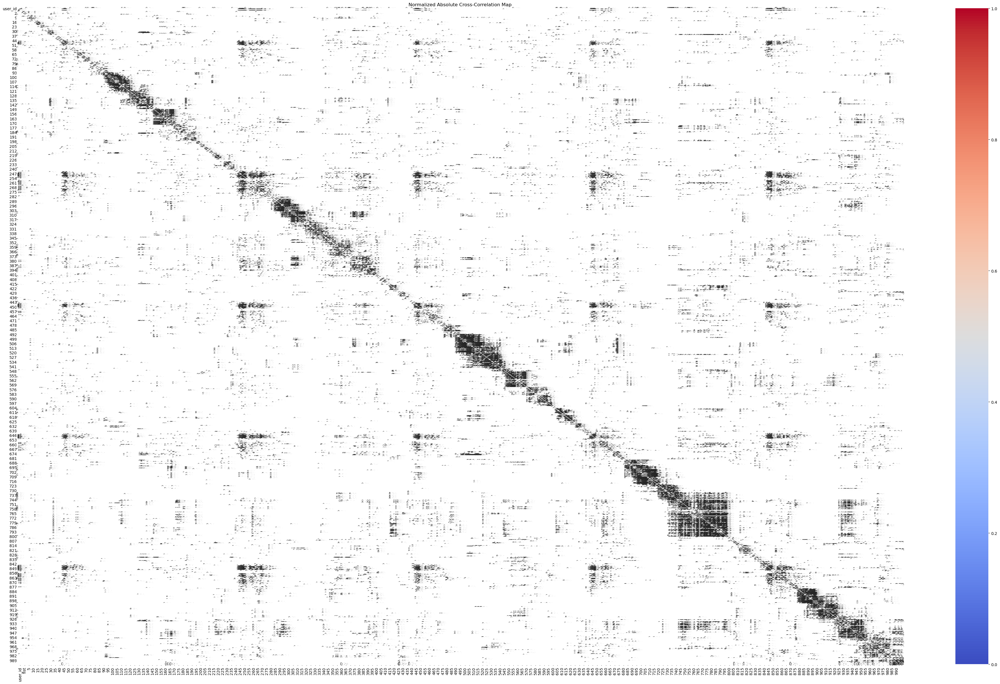

In [1]:
import pandas,numpy,seaborn
import matplotlib.pyplot as plot

dataset = pandas.read_csv('standardize_edilmis_veri.csv')

correlation_of_dataset = dataset.corr()

absolute_of_corr = numpy.abs(correlation_of_dataset)
normalized_corr = (absolute_of_corr - absolute_of_corr.min()) / (absolute_of_corr.max() - absolute_of_corr.min())

plot.figure(figsize=(50,30))
seaborn.heatmap(normalized_corr, annot=True, cmap='coolwarm', vmin=0, vmax=1, fmt='.2f', annot_kws={'size':10}, linewidth=.9)
plot.title('Normalized Absolute Cross-Correlation Map')
plot.show()

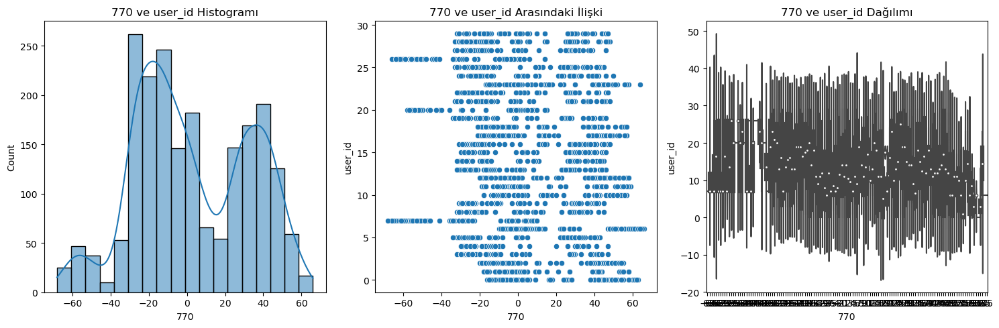

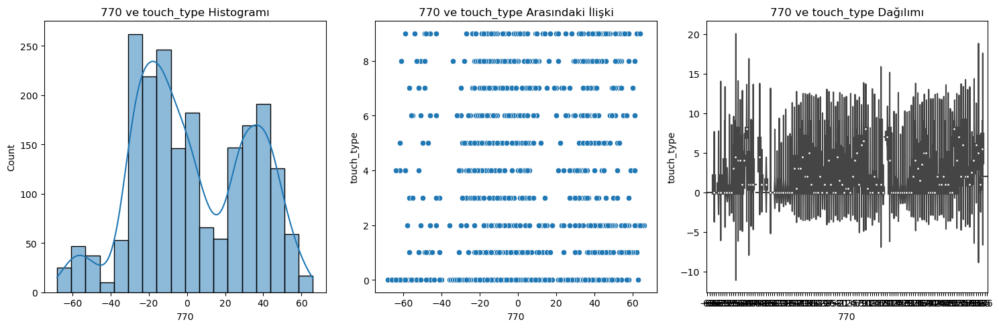

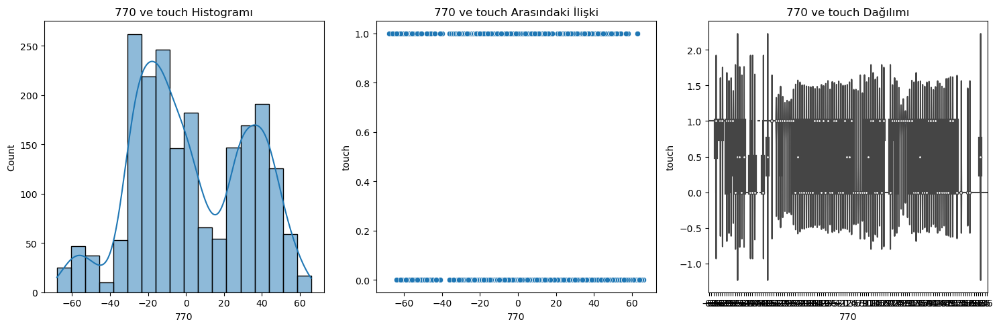

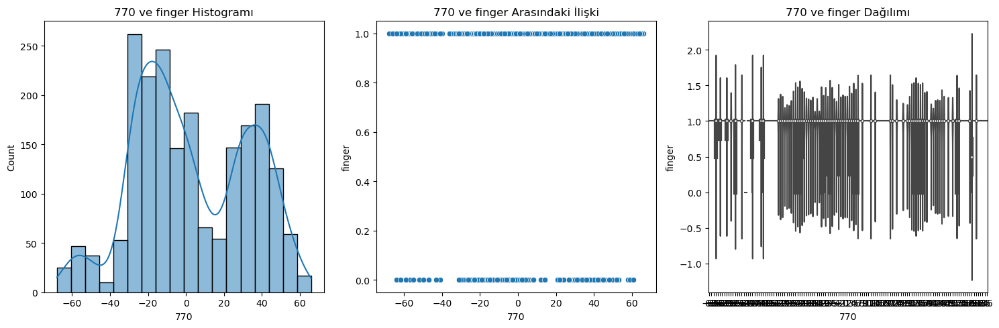

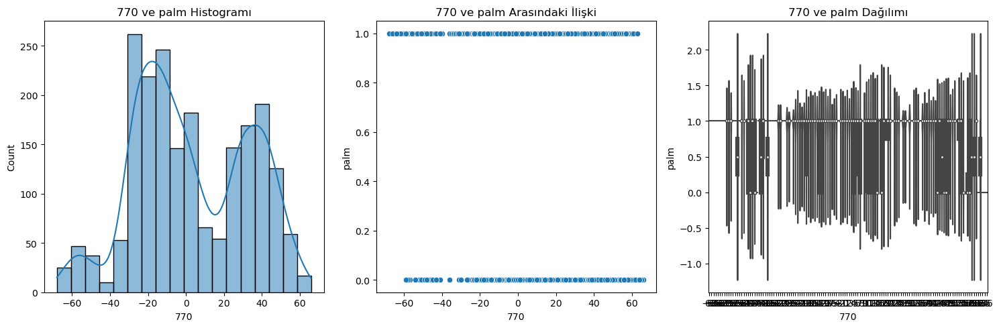

...

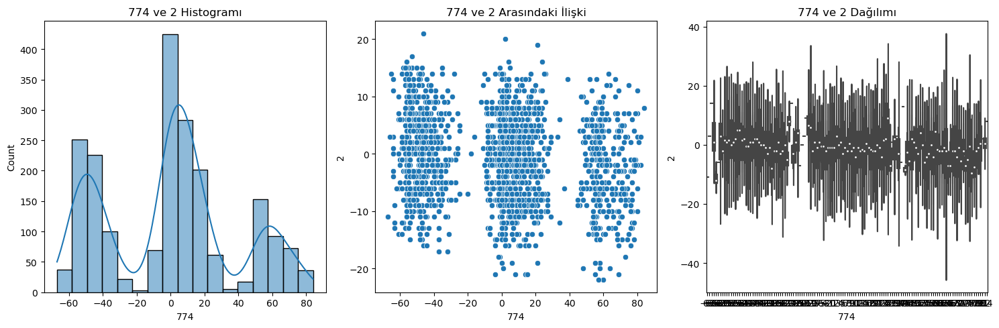

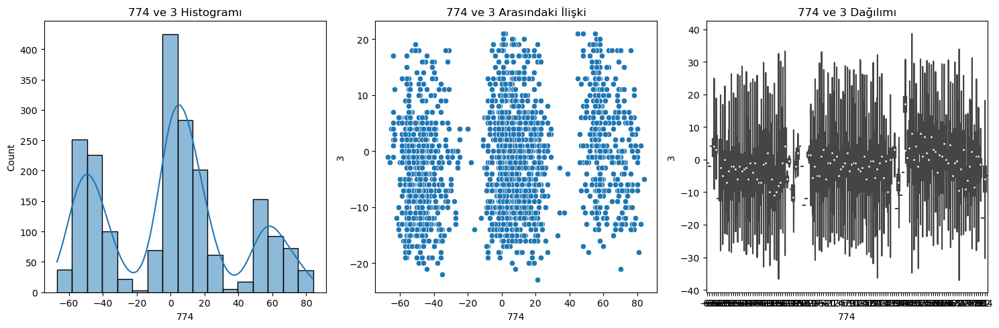

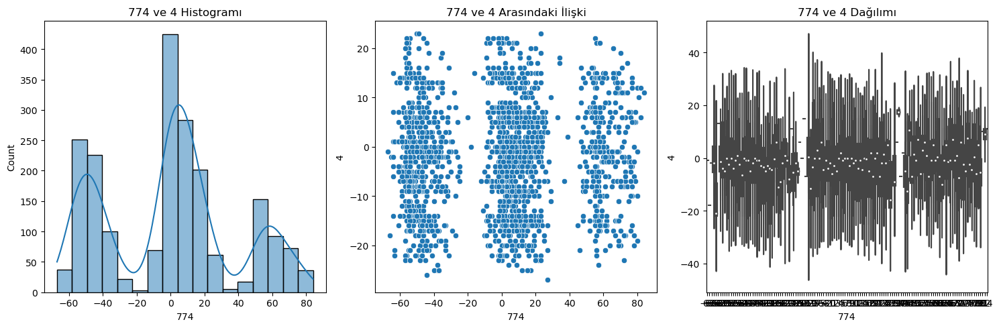

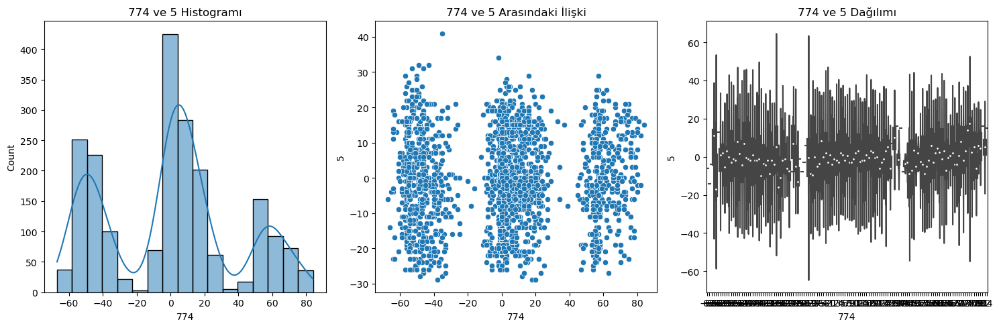

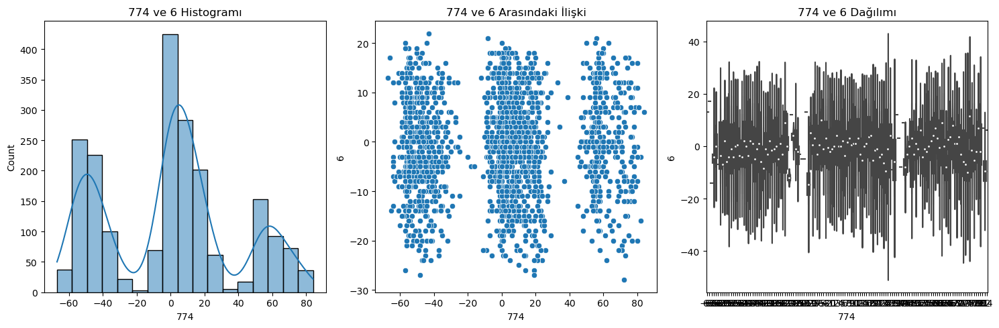

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Veri setini yükleme
veri = pd.read_csv('touchstandard.csv')

# Girdi değişkenlerinin isimlerini alın (son 6 sütun hariç)
girdi_degiskenleri = veri.columns[775:780]

# Çıktı değişkenleri için sütun aralığını belirleyin
cikti_degiskenleri = veri.columns[:-988]

# Her bir girdi değişkeni için her bir çıktı değişkeniyle olan ilişkiyi görselleştirme
for girdi_degiskeni in girdi_degiskenleri:
    for cikti_degiskeni in cikti_degiskenleri:
        plt.figure(figsize=(15, 5))

        # Histogramlar
        plt.subplot(1, 3, 1)
        sns.histplot(x=girdi_degiskeni, data=veri, kde=True)
        plt.title(f'{girdi_degiskeni} ve {cikti_degiskeni} Histogramı')

        # Saçılım (Scatter) Grafikleri
        plt.subplot(1, 3, 2)
        sns.scatterplot(x=girdi_degiskeni, y=cikti_degiskeni, data=veri)
        plt.title(f'{girdi_degiskeni} ve {cikti_degiskeni} Arasındaki İlişki')

        # Keman Grafikleri
        plt.subplot(1, 3, 3)
        sns.violinplot(x=girdi_degiskeni, y=cikti_degiskeni, data=veri)
        plt.title(f'{girdi_degiskeni} ve {cikti_degiskeni} Dağılımı')

        plt.tight_layout()
        plt.show()


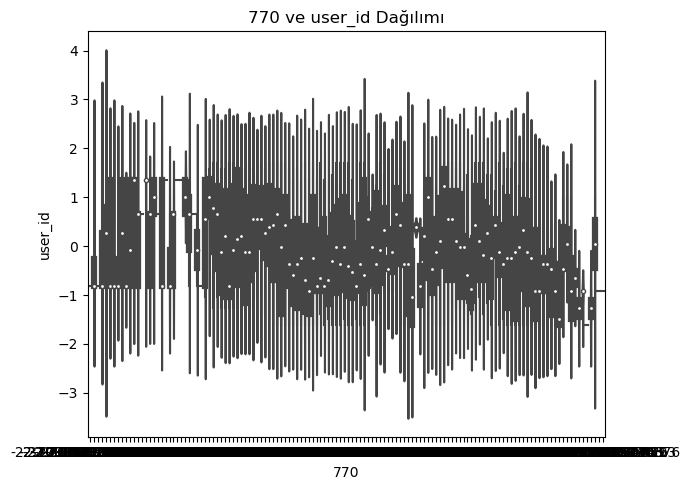

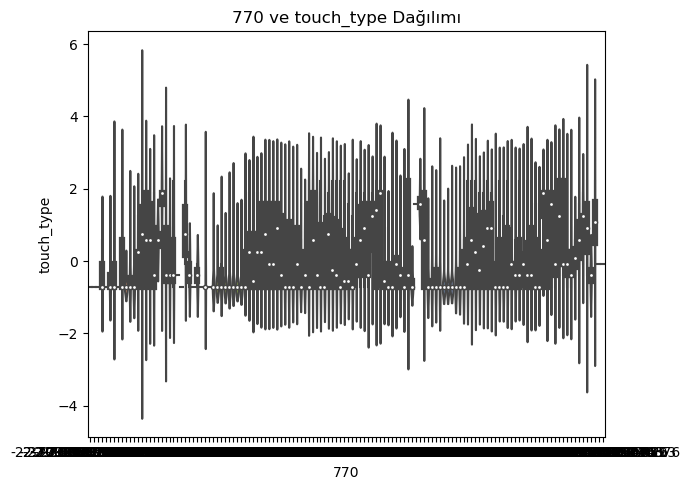

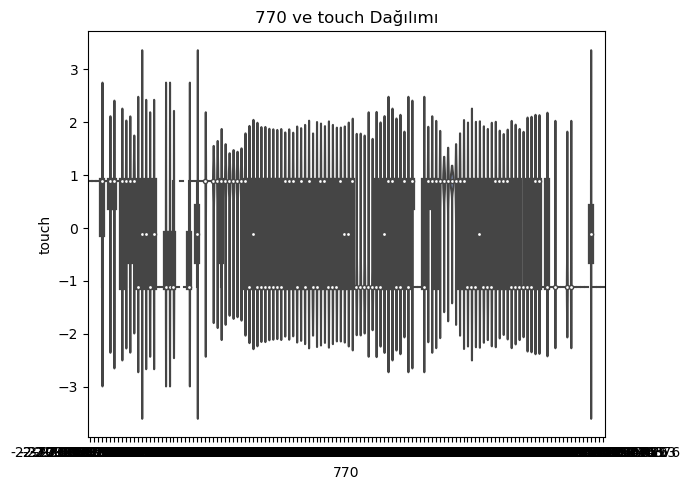

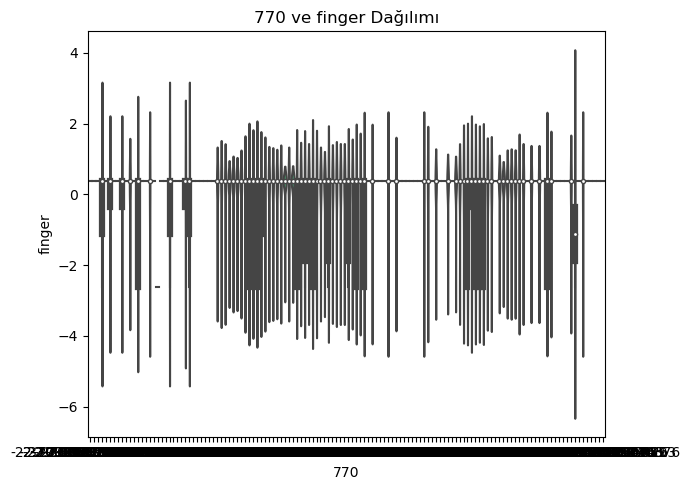

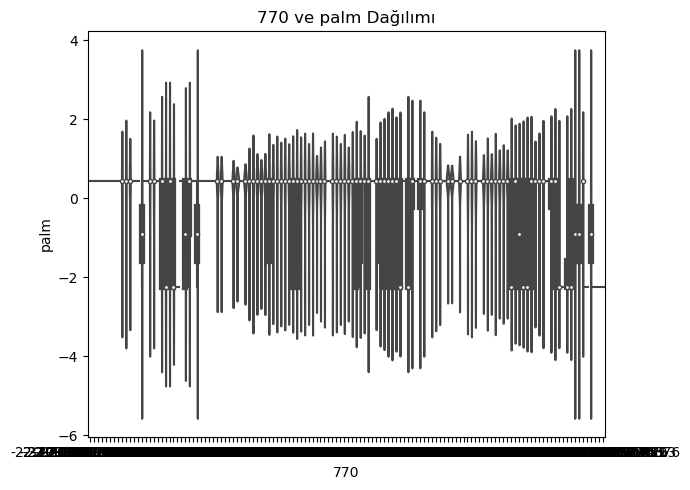

...

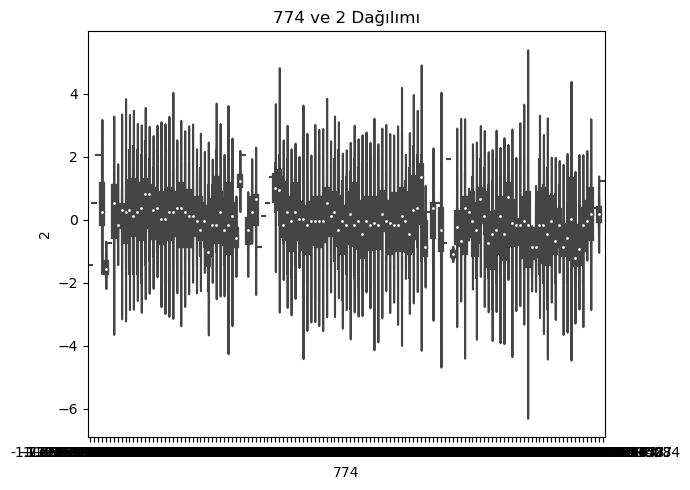

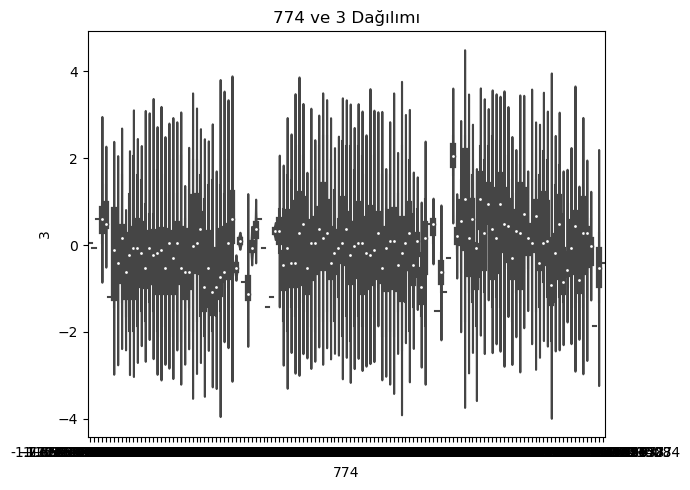

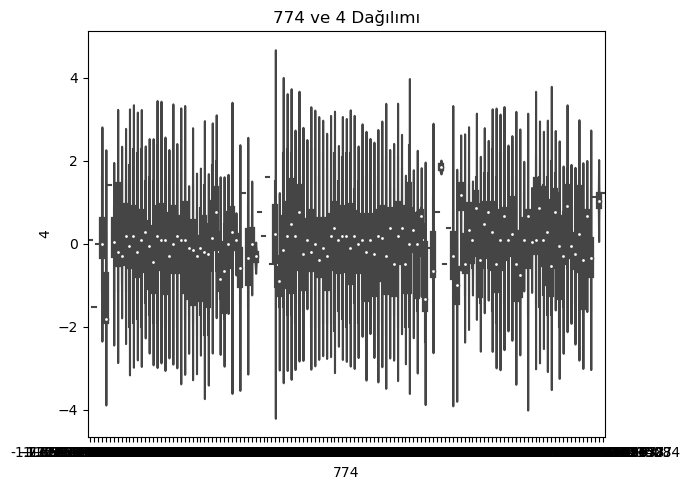

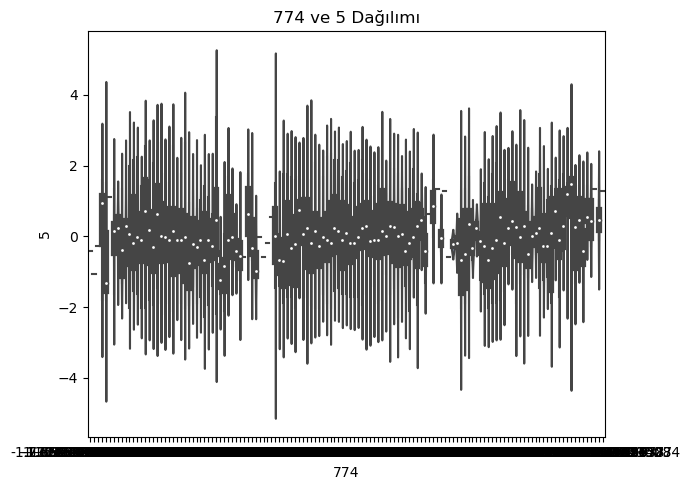

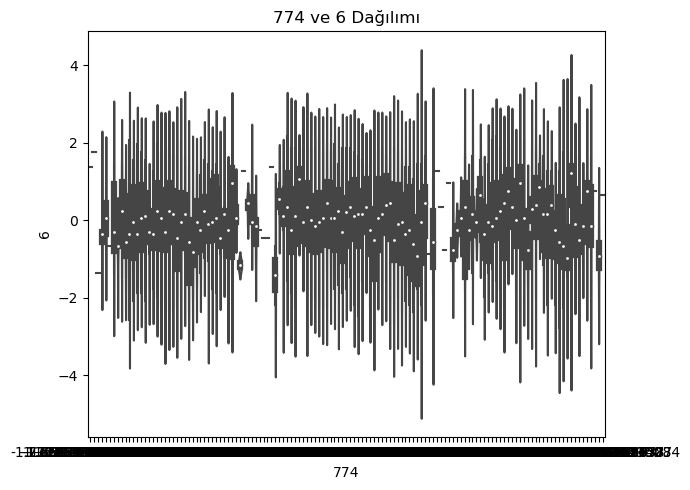

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Veri setini yükleme
veri = pd.read_csv('standardize_edilmis_veri.csv')

# Girdi değişkenlerinin isimlerini alın (son 6 sütun hariç)
girdi_degiskenleri = veri.columns[775:780]

# Çıktı değişkenleri için sütun aralığını belirleyin
cikti_degiskenleri = veri.columns[:-988]

# Her bir girdi değişkeni için her bir çıktı değişkeniyle olan ilişkiyi görselleştirme
for girdi_degiskeni in girdi_degiskenleri:
    for cikti_degiskeni in cikti_degiskenleri:
        plt.figure(figsize=(7, 5))

        # Keman Grafikleri
        sns.violinplot(x=girdi_degiskeni, y=cikti_degiskeni, data=veri)
        plt.title(f'{girdi_degiskeni} ve {cikti_degiskeni} Dağılımı')

        plt.tight_layout()
        plt.show()


In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["user_id"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 1.0
Naive Bayes test accuracy score: 1.0
Random Forest cross-validation mean accuracy score: 1.0
Random Forest test accuracy score: 1.0
SVM cross-validation mean accuracy score: 1.0
SVM test accuracy score: 1.0
Best performing model based on test accuracy: Naive Bayes
Test set accuracy score (best model): 1.0

Evaluation metric scores for best model which is Naive Bayes:
Test set accuracy: 1.0
Test set precision: 1.0
Test set recall: 1.0
Test set F1 score: 1.0


['best_model_isedataset_classification.pkl']

In [9]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["touch_type"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 0.506160384331116
Naive Bayes test accuracy score: 0.48058252427184467
Random Forest cross-validation mean accuracy score: 0.6015779748706579
Random Forest test accuracy score: 0.6043689320388349
SVM cross-validation mean accuracy score: 0.5967147080561713
SVM test accuracy score: 0.5898058252427184
Best performing model based on test accuracy: Random Forest
Test set accuracy score (best model): 0.6092233009708737

Evaluation metric scores for best model which is Random Forest:
Test set accuracy: 0.6092233009708737
Test set precision: 0.48814618940372195
Test set recall: 0.6092233009708737
Test set F1 score: 0.52633754730872


/Users/ardilsilanaydin/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


['best_model_isedataset_classification.pkl']

In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["touch"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 0.8448928307464894
Naive Bayes test accuracy score: 0.8470873786407767
Random Forest cross-validation mean accuracy score: 0.8600776053215078
Random Forest test accuracy score: 0.8592233009708737
SVM cross-validation mean accuracy score: 0.8582852919438286
SVM test accuracy score: 0.8689320388349514
Best performing model based on test accuracy: SVM
Test set accuracy score (best model): 0.8689320388349514

Evaluation metric scores for best model which is SVM:
Test set accuracy: 0.8689320388349514
Test set precision: 0.8710825193680792
Test set recall: 0.8689320388349514
Test set F1 score: 0.867885955027554


['best_model_isedataset_classification.pkl']

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["finger"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 0.7135070214338507
Naive Bayes test accuracy score: 0.7184466019417476
Random Forest cross-validation mean accuracy score: 0.873481152993348
Random Forest test accuracy score: 0.8737864077669902
SVM cross-validation mean accuracy score: 0.873481152993348
SVM test accuracy score: 0.8737864077669902
Best performing model based on test accuracy: Random Forest
Test set accuracy score (best model): 0.8737864077669902

Evaluation metric scores for best model which is Random Forest:
Test set accuracy: 0.8737864077669902
Test set precision: 0.763502686398341
Test set recall: 0.8737864077669902
Test set F1 score: 0.8149303284873484


/Users/ardilsilanaydin/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


['best_model_isedataset_classification.pkl']

In [12]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["palm"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 0.8600923872875091
Naive Bayes test accuracy score: 0.8422330097087378
Random Forest cross-validation mean accuracy score: 0.9495232815964524
Random Forest test accuracy score: 0.9320388349514563
SVM cross-validation mean accuracy score: 0.9452512934220252
SVM test accuracy score: 0.9296116504854369
Best performing model based on test accuracy: Random Forest
Test set accuracy score (best model): 0.941747572815534

Evaluation metric scores for best model which is Random Forest:
Test set accuracy: 0.941747572815534
Test set precision: 0.9439423611447499
Test set recall: 0.941747572815534
Test set F1 score: 0.9370292269714351


['best_model_isedataset_classification.pkl']

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib

# Veri setini yükle
data = pd.read_csv('touchstandard.csv')

# Bağımsız değişkenler ve hedef değişkeni ayır
X = df.drop(columns=["user_id", "touch_type", "touch", "finger", "palm", "fist"])
y = df["fist"]

models = {
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC()
}

def evaluate_model(model, X, y):
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=47)
    scores = cross_val_score(model, X, y, scoring="accuracy", cv=cv)
    return scores.mean()

results = {}

# Evaluate models, split the dataset, and print both mean accuracy and test accuracy
for name, model in models.items():
    # Split the dataset for testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)
    # Evaluate the model using cross-validation
    mean_accuracy = evaluate_model(model, X_train, y_train)

    # Train the model on the training set
    model.fit(X_train, y_train)
    # Calculate the test accuracy
    test_accuracy = model.score(X_test, y_test)
    results[name] = test_accuracy
    # Print both mean accuracy and test accuracy
    print(f"{name} cross-validation mean accuracy score:", mean_accuracy)
    print(f"{name} test accuracy score:", test_accuracy)

# Select the best performing model based on mean accuracy
best_model = max(results, key=results.get)
print("Best performing model based on test accuracy:", best_model)

# Split the dataset for testing using the best model with specified random seed and stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47, stratify=y)

# Train the best model
best_model_instance = models[best_model]
best_model_instance.fit(X_train, y_train)

# Evaluate the performance of the best model on the test set
test_accuracy = best_model_instance.score(X_test, y_test)
print("Test set accuracy score (best model):", test_accuracy)

# Calculate evaluation metrics for the best model
y_pred = best_model_instance.predict(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the evaluation metrics for the best model
print("\nEvaluation metric scores for best model which is {}:".format(best_model))
print("Test set accuracy:", test_accuracy)
print("Test set precision:", precision)
print("Test set recall:", recall)
print("Test set F1 score:", f1)

joblib.dump(best_model, 'best_model_isedataset_classification.pkl')

Naive Bayes cross-validation mean accuracy score: 0.7457169253510717
Naive Bayes test accuracy score: 0.7135922330097088
Random Forest cross-validation mean accuracy score: 0.8497560975609757
Random Forest test accuracy score: 0.8398058252427184
SVM cross-validation mean accuracy score: 0.8473244641537324
SVM test accuracy score: 0.8470873786407767
Best performing model based on test accuracy: SVM
Test set accuracy score (best model): 0.8470873786407767

Evaluation metric scores for best model which is SVM:
Test set accuracy: 0.8470873786407767
Test set precision: 0.7175570270525026
Test set recall: 0.8470873786407767
Test set F1 score: 0.776960565428728


/Users/ardilsilanaydin/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


['best_model_isedataset_classification.pkl']